# **Optimize the Power Consumption of Zone 1 based on various environmental and meteorological factors in Wellington, New-Zealand**

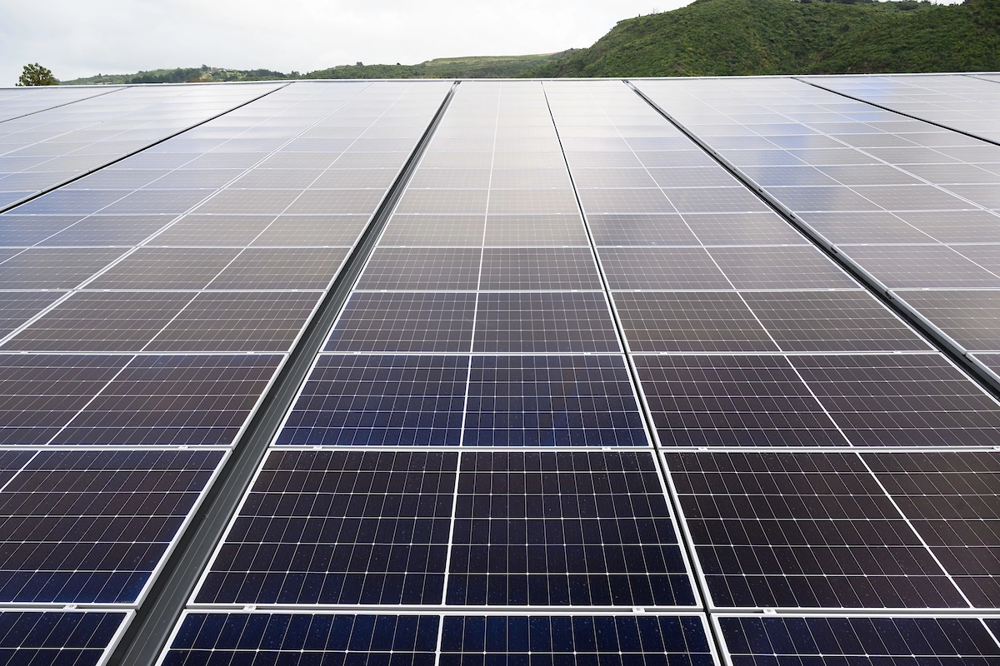

- **The objective is to develop a machine learning model that can predict the power consumption (Zone 1 Power Consumption) of Wellington, New Zealand based on various environmental and meteorological factors. The goal is to create an accurate predictive model that can assist in managing energy resources efficiently and optimizing power consumption in that zone.**

- **Data Dictionary**
1. Sr no.: Serial Number
2. Temperature: The temperature in Celsius at the specific location.
3. Humidity: The relative humidity percentage at the location. (g.m-3, i.e. units of grams of water vapor per cubic meter of air.)
4. Wind Speed: The speed of the wind at the location. (nautical mile per hour )
5. General Diffuse Flows: Refer to a specific measurement or calculation related to the amount or intensity of diffuse solar radiation in a particular area. (Mtrsqr per sec)
6. Diffuse Flows: The measure of diffuse solar radiation. (Mtrsqr per sec)
7. Air Quality Index: An index representing the air quality in the area. (particles in micrograms per cubic meter.)
8. Cloudiness: The level of cloud cover or cloudiness at the location. (1-Yes,0-No)
9. Zone 1 Power Consumption: The power consumption in the specific zone, which is the target variable to be predicted. (in KWR- Target value)

# Importing Libraries

In [6]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
sns.set()
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

# Loading the Dataset

In [8]:
df = pd.read_excel('City Power Consumption.xlsx')

In [9]:
df.head()

,S no,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
0,1,6.559,73.8,0.083,0.051,0.119,158.0,1,34055.69620
1,2,6.414,74.5,0.083,0.070,0.085,159.0,1,29814.68354
2,3,6.313,74.5,0.080,0.062,0.100,151.0,1,29128.10127
3,4,6.121,75,0.083,0.091,0.096,151.0,1,28228.86076
4,5,5.921,75.7,0.081,0.048,0.085,154.0,1,27335.69620


In [10]:
df = df.drop(columns=['S no'])

In [11]:
df.columns = [i.strip() for i in df.columns]

# Data Preprocessing and EDA

## Data Exploration

In [14]:
df.shape

(52583, 8)

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52583 entries, 0 to 52582
Data columns (total 8 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Temperature                  52263 non-null  object 
 1   Humidity                     52558 non-null  object 
 2   Wind Speed                   52512 non-null  float64
 3   general diffuse flows        52275 non-null  float64
 4   diffuse flows                52568 non-null  float64
 5   Air Quality Index (PM)       52565 non-null  float64
 6   Cloudiness                   52583 non-null  int64  
 7   Power Consumption in A Zone  52583 non-null  float64
dtypes: float64(5), int64(1), object(2)
memory usage: 3.2+ MB


In [16]:
df[df['Temperature'].astype(str).str.contains(r'[a-zA-Z]')]['Temperature'].unique()

array([nan, '5.488 dc', '13.65 CD', '12.31 dc'], dtype=object)

In [17]:
df['Temperature'] = np.where(df['Temperature'] == '5.488 dc', 5.488, df['Temperature'])
df['Temperature'] = np.where(df['Temperature'] == '13.65 CD', 13.65, df['Temperature'])
df['Temperature'] = np.where(df['Temperature'] == '12.31 dc', 12.31, df['Temperature'])

In [18]:
df[df['Humidity'].astype(str).str.contains(r'[a-zA-Z]')]['Humidity'].unique()

array(['84.8 i', nan], dtype=object)

In [19]:
df['Humidity'] = np.where(df['Humidity'] == '84.8 i', 84.8, df['Humidity'])

In [20]:
df['Humidity'] = pd.to_numeric(df['Humidity'], errors='coerce')
df['Temperature'] = pd.to_numeric(df['Temperature'], errors='coerce')

In [21]:
round((df.describe().T),2)

,count,mean,std,min,25%,50%,75%,max
Temperature,52263.0,18.83,5.81,3.25,14.43,18.82,22.91,40.01
Humidity,52558.0,68.29,15.55,11.34,58.33,69.88,81.40,94.80
Wind Speed,52512.0,1.96,2.35,0.05,0.08,0.09,4.92,6.48
general diffuse flows,52275.0,182.96,264.57,0.00,0.06,5.23,320.10,1163.00
diffuse flows,52568.0,74.87,124.08,0.01,0.12,4.41,100.50,936.00
Air Quality Index (PM),52565.0,154.50,2.87,150.00,152.00,155.00,157.00,159.00
Cloudiness,52583.0,0.01,0.10,0.00,0.00,0.00,0.00,1.00
Power Consumption in A Zone,52583.0,31061.82,8021.06,9457.75,24738.86,31189.79,36721.58,52204.40


In [22]:
df.isnull().sum()

Temperature                    320
Humidity                        25
Wind Speed                      71
general diffuse flows          308
diffuse flows                   15
Air Quality Index (PM)          18
Cloudiness                       0
Power Consumption in A Zone      0
dtype: int64

In [23]:
df.duplicated().sum()

0

In [24]:
for i in df:
    print(i.upper())
    print('Unique Counts: ',df[i].nunique())
    print('***************************')

TEMPERATURE
Unique Counts:  3436
***************************
HUMIDITY
Unique Counts:  4443
***************************
WIND SPEED
Unique Counts:  548
***************************
GENERAL DIFFUSE FLOWS
Unique Counts:  10497
***************************
DIFFUSE FLOWS
Unique Counts:  10449
***************************
AIR QUALITY INDEX (PM)
Unique Counts:  10
***************************
CLOUDINESS
Unique Counts:  2
***************************
POWER CONSUMPTION IN A ZONE
Unique Counts:  27760
***************************


In [25]:
cat_col = []
num_col = []
for i in df:
    if df[i].nunique() > 2:
        num_col.append(i)
    else:
        cat_col.append(i)

In [26]:
print('Categorical features are: ',cat_col)
print('Numerical features are: ', num_col)

Categorical features are:  ['Cloudiness']
Numerical features are:  ['Temperature', 'Humidity', 'Wind Speed', 'general diffuse flows', 'diffuse flows', 'Air Quality Index (PM)', 'Power Consumption in A Zone']


## Univariate Analysis

### Distribution of numerical features

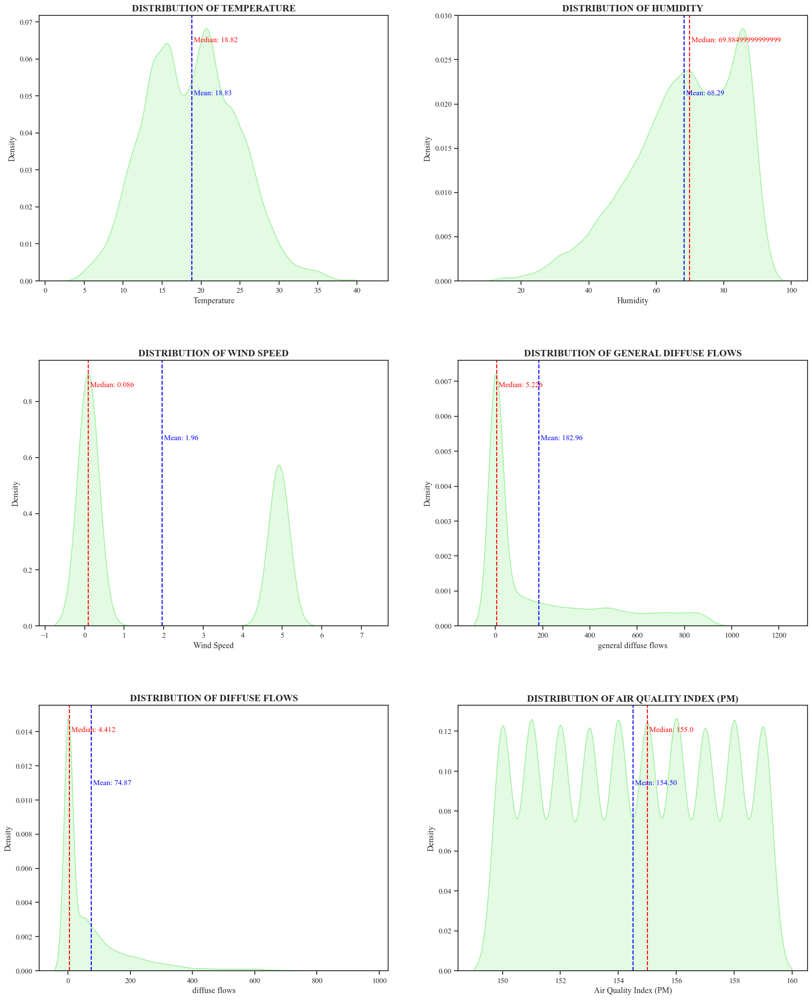

In [29]:
sns.set_style('ticks')
mpl.rcParams['font.family'] = 'Times New Roman'

fig = plt.figure(figsize=(20,25))
spec = fig.add_gridspec(3,2)
spec.update(wspace=0.2,hspace=0.3)

sections = []
for row in range(3):
    for col in range(2):
        sec = fig.add_subplot(spec[row, col])
        sections.append(sec)
count = 0        
for feature in num_col[:-1]:
    median_val = df[feature].median()
    mean_val = df[feature].mean()
    ax=sections[count]
    sns.kdeplot(data=df, x=feature, fill = True,color='lightgreen',ax=ax)
    
    ax.axvline(median_val, color='red', linestyle='--')
    ax.text(median_val, ax.get_ylim()[1]*0.9, f' Median: {median_val}', color='red', fontsize=11, ha='left')

    ax.axvline(mean_val, color='blue', linestyle='--')
    ax.text(mean_val, ax.get_ylim()[1]*0.7, f' Mean: {mean_val:.2f} ', color='blue', fontsize=11, ha='left')
    
    sections[count].set_title('DISTRIBUTION OF '+ feature.upper(), fontweight='bold', fontsize = 14)
    sections[count].set_xlabel(feature, fontsize=12)
    count+=1

plt.show()

### Distribution of categorical feature

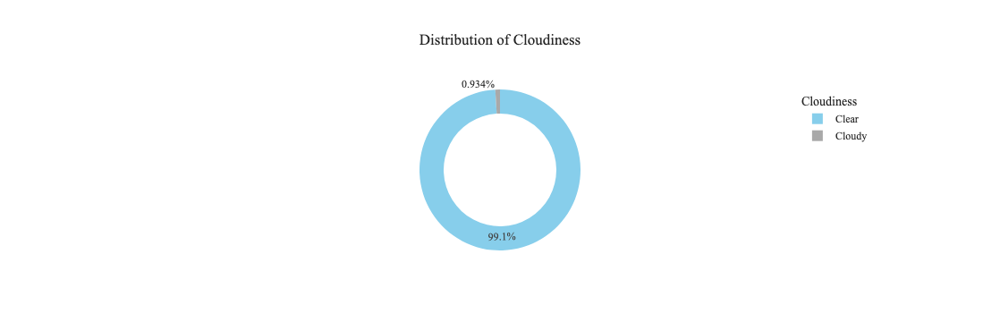

In [31]:
clouds = df['Cloudiness'].value_counts().to_frame().reset_index()
clouds['Cloudiness'] = clouds['Cloudiness'].map({0: 'Clear', 1: 'Cloudy'})

fig = px.pie(clouds, names='Cloudiness', values='count', hole=0.7,
             color='Cloudiness',
             color_discrete_map={'Clear': 'skyblue', 'Cloudy': 'darkgrey'},
             title='Distribution of Cloudiness', template='simple_white')

fig.update_layout(font_family='Times New Roman', title_x=0.5, legend_title_text='Cloudiness')
fig.show()


### Distribution of target variable

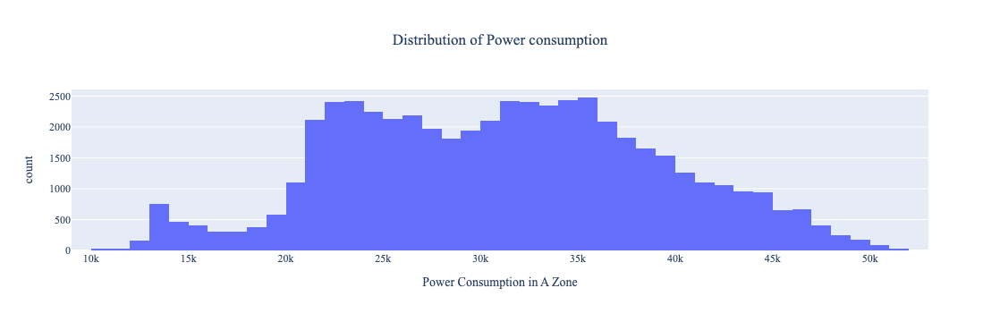

In [33]:
df.columns
fig = px.histogram(df,x = 'Power Consumption in A Zone',title='Distribution of Power consumption', nbins=50)
fig.update_layout(font_family='Times New Roman', title_x=0.5)
fig.show()

## Bivariate Analysis

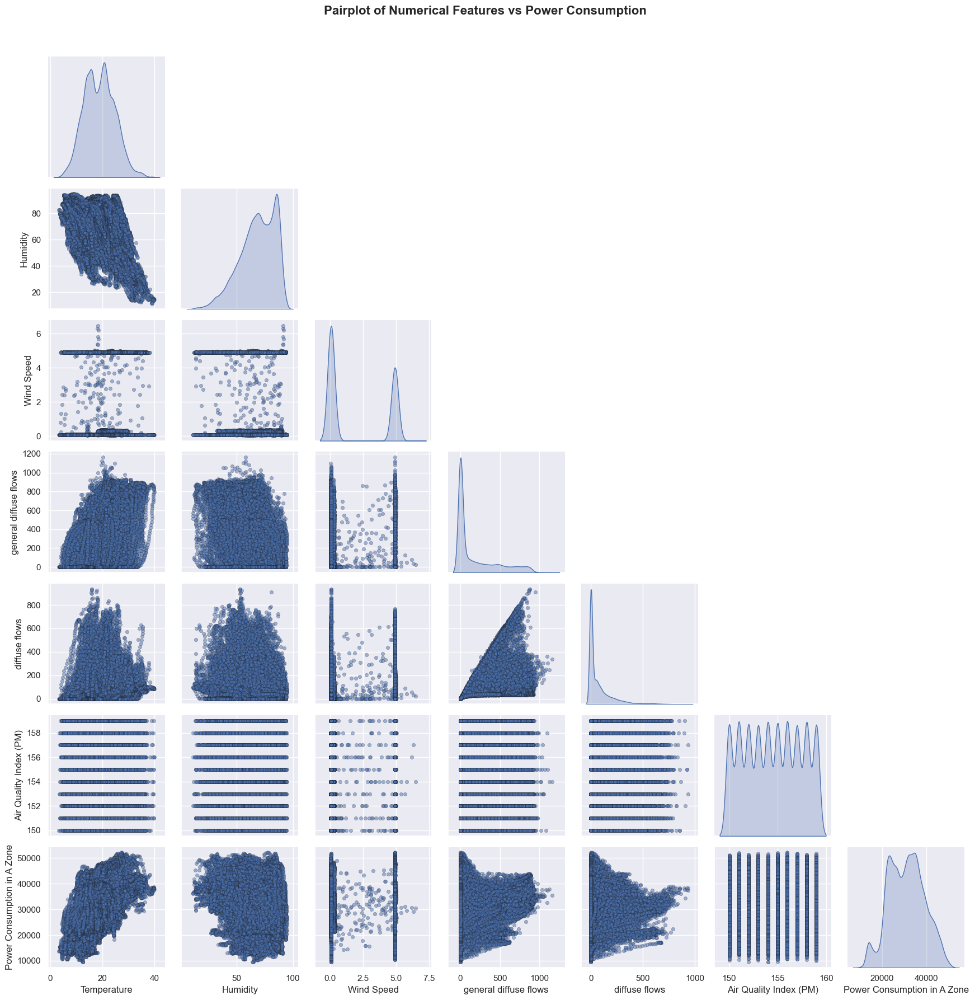

In [35]:
sns.set(context='notebook', palette="deep")

pairplot = sns.pairplot(df[num_col],diag_kind="kde",corner=True,plot_kws={'alpha': 0.5, 's': 20, 'edgecolor': 'k'})
pairplot.fig.suptitle("Pairplot of Numerical Features vs Power Consumption", y=1.02, fontsize=16, fontweight='bold')

plt.tight_layout()
plt.show()

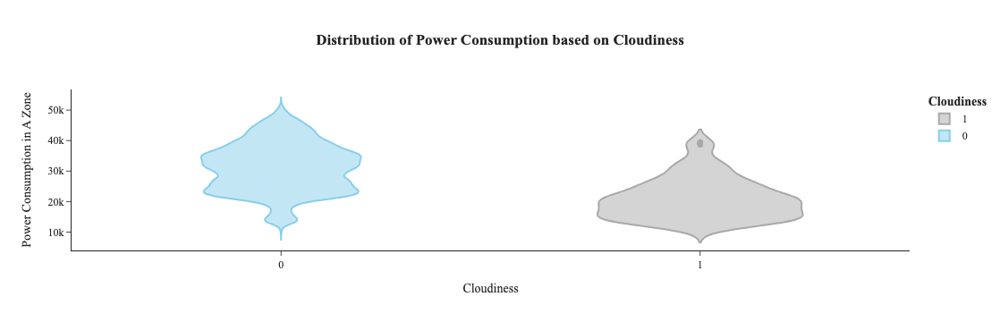

In [36]:
fig = px.violin(df, x='Cloudiness',y='Power Consumption in A Zone', color='Cloudiness', template='simple_white',
                color_discrete_map={0: 'skyblue', 1: 'darkgrey'},title='<b>Distribution of Power Consumption based on Cloudiness')
fig.update_layout(title_x=0.5,font_family="Times New Roman",legend_title_text="<b>Cloudiness")
fig.show()

## Correlation matrix

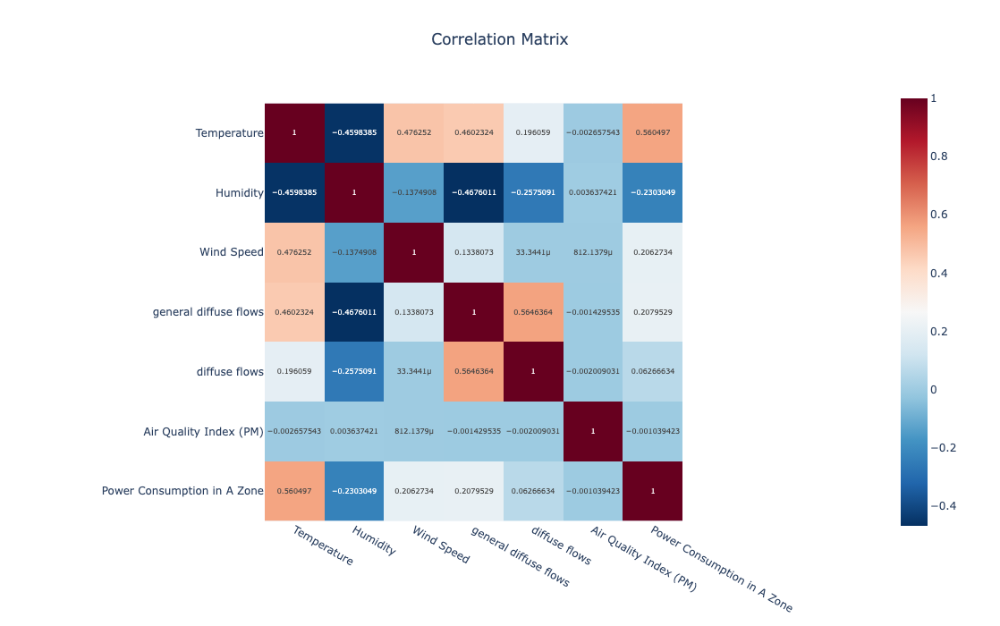

In [38]:
corr_matrix = df[num_col].corr()

fig = px.imshow(corr_matrix,text_auto=True,color_continuous_scale='RdBu_r',
                title="Correlation Matrix")
fig.update_layout(width=800, height=700, title_x=0.5)
fig.show()

## Splitting dependent and independent variables

In [40]:
x = df.iloc[:,:-1]

In [41]:
y = df.iloc[:,-1]

In [42]:
print(x.head())
print('\n')
print(y.head())

   Temperature  Humidity  Wind Speed  general diffuse flows  diffuse flows  \
0        6.559      73.8       0.083                  0.051          0.119   
1        6.414      74.5       0.083                  0.070          0.085   
2        6.313      74.5       0.080                  0.062          0.100   
3        6.121      75.0       0.083                  0.091          0.096   
4        5.921      75.7       0.081                  0.048          0.085   

   Air Quality Index (PM)  Cloudiness  
0                   158.0           1  
1                   159.0           1  
2                   151.0           1  
3                   151.0           1  
4                   154.0           1  


0    34055.69620
1    29814.68354
2    29128.10127
3    28228.86076
4    27335.69620
Name: Power Consumption in A Zone, dtype: float64


## Handling Missing Values

### Imputation (Simple and KNN)

In [45]:
from sklearn.impute import KNNImputer, SimpleImputer

In [46]:
simputer = SimpleImputer(strategy='median')
cols = ['Temperature','Humidity','Air Quality Index (PM)']
x_imputed = simputer.fit_transform(x[cols])
x[cols] = pd.DataFrame(data=x_imputed, index=x.index)

In [47]:
x.isnull().sum()

Temperature                 0
Humidity                    0
Wind Speed                 71
general diffuse flows     308
diffuse flows              15
Air Quality Index (PM)      0
Cloudiness                  0
dtype: int64

In [48]:
knnimputer = KNNImputer()
skewed_cols = ['Wind Speed','general diffuse flows','diffuse flows']
x_imputed = knnimputer.fit_transform(x[skewed_cols])
x[skewed_cols]  = pd.DataFrame(data = x_imputed, index=x.index)

In [49]:
x.isnull().sum()

Temperature               0
Humidity                  0
Wind Speed                0
general diffuse flows     0
diffuse flows             0
Air Quality Index (PM)    0
Cloudiness                0
dtype: int64

## Outlier Treatement (Clipping Method)

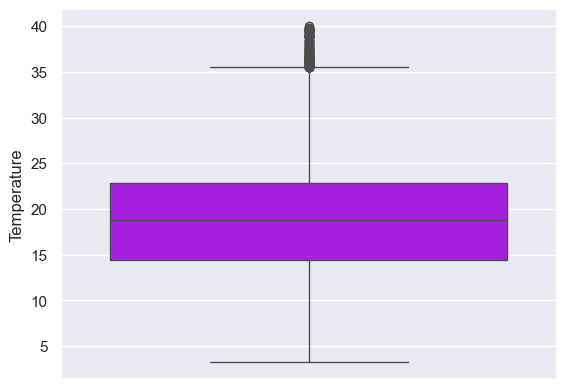

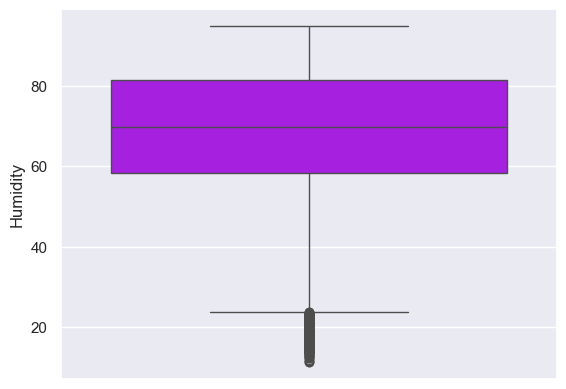

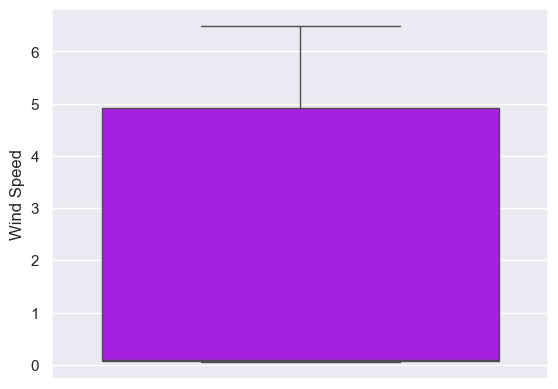

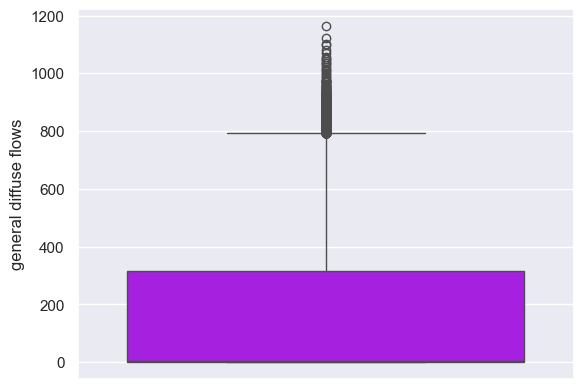

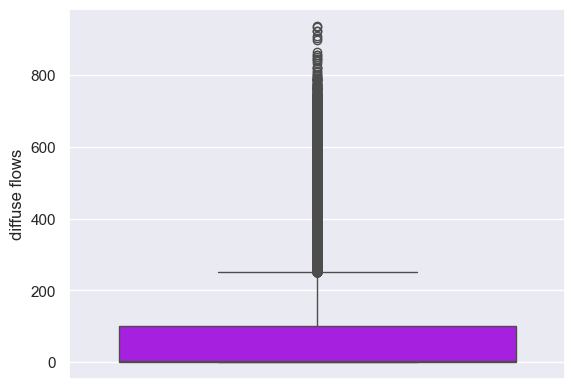

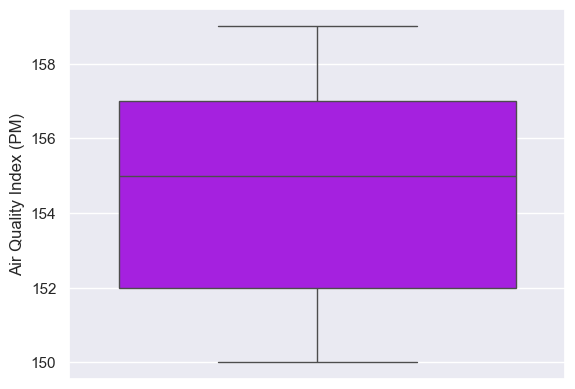

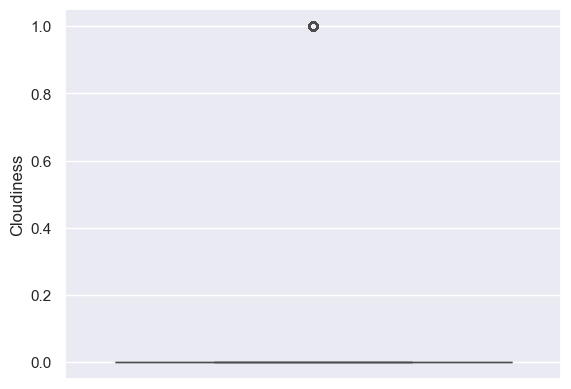

In [51]:
for i in x:
    sns.boxplot(x[i], color='#b102fe')
    plt.show()

In [52]:
for i in ['general diffuse flows','diffuse flows']:
    Q1 = x[i].quantile(0.25)
    Q3 = x[i].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    x[i] = x[i].clip(lower, upper)

## Train Test Split

In [54]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [55]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(x_test.shape)

(42066, 7)
(10517, 7)
(42066,)
(10517, 7)


## Feature Scaling 

In [57]:
from sklearn.preprocessing import MinMaxScaler

In [58]:
mms = MinMaxScaler()
cols_to_scale = ['Temperature','Humidity','Wind Speed','general diffuse flows','diffuse flows','Air Quality Index (PM)']
x_scaled = mms.fit_transform(x_train[cols_to_scale])

In [59]:
x_train[cols_to_scale] = pd.DataFrame(data=x_scaled, index=x_train.index)

In [60]:
x_train.head()

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness
25421,0.595789,0.669063,0.792683,1.000000,0.235402,0.888889,0
24106,0.518266,0.699856,0.003252,0.797948,0.321398,0.333333,0
16072,0.404564,0.751977,0.003902,0.431584,1.000000,0.555556,0
14948,0.377635,0.789121,0.003740,0.014793,0.041501,0.333333,0
19487,0.408373,0.805895,0.791545,0.141040,0.411816,1.000000,0


In [61]:
x_test_scaled = mms.transform(x_test[cols_to_scale])
x_test[cols_to_scale] = pd.DataFrame(data=x_test_scaled, index=x_test.index)

# Model Building

In [63]:
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor, AdaBoostRegressor
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

In [64]:
models={
    'Linear Regression':LinearRegression(),
     'K Nearest Neighbors':KNeighborsRegressor(),
    'Decision Tree':DecisionTreeRegressor(),
    'Random Forest Regression':RandomForestRegressor(),
      "Support Vector Regressor":SVR(),
     'Xgboost Regression':XGBRegressor(),
    'AdaBoost': AdaBoostRegressor(),
    'GradientBoost' : GradientBoostingRegressor()
   }

In [65]:
model_list = []
accuracy_list = []


for model_name, model in models.items():
    
    model.fit(x_train, y_train)
    y_pred_train = model.predict(x_train)
    y_pred = model.predict(x_test)

    # Evaluate the model
    train_accuracy = r2_score(y_train,y_pred_train)
    test_accuracy = r2_score(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse=mean_squared_error(y_test,y_pred)
  

    print(f"Model: {model_name}")
    print("Training R2 score: ", train_accuracy)
    print("Testing R2 score: ", test_accuracy)
    print("Mean Absolute Error (MAE):", mae)
    print("Mean Squared Error (MSE):", mse)
    
    

    model_list.append(model_name)
    accuracy_list.append(test_accuracy)
    

    print("=" * 35)
    print('\n')

max_accuracy_index = accuracy_list.index(max(accuracy_list))
print(f"The best model based on accuracy is {model_list[max_accuracy_index]} with Testing Accuracy: {accuracy_list[max_accuracy_index]}")

Model: Linear Regression
Training R2 score:  0.32544705281701247
Testing R2 score:  0.33113183983733296
Mean Absolute Error (MAE): 5299.846086854908
Mean Squared Error (MSE): 43208675.96256039


Model: K Nearest Neighbors
Training R2 score:  0.5776077116006197
Testing R2 score:  0.37297258905670283
Mean Absolute Error (MAE): 4774.46326132304
Mean Squared Error (MSE): 40505776.52328848


Model: Decision Tree
Training R2 score:  0.9998845919339645
Testing R2 score:  0.25916737600157647
Mean Absolute Error (MAE): 4218.745104452791
Mean Squared Error (MSE): 47857558.03513861


Model: Random Forest Regression
Training R2 score:  0.9480902612699557
Testing R2 score:  0.6365952862908852
Mean Absolute Error (MAE): 3390.524031664393
Mean Squared Error (MSE): 23475831.939892944


Model: Support Vector Regressor
Training R2 score:  0.08126781809826567
Testing R2 score:  0.08715250544170028
Mean Absolute Error (MAE): 6133.687340757065
Mean Squared Error (MSE): 58969665.39117703


Model: Xgboost Re

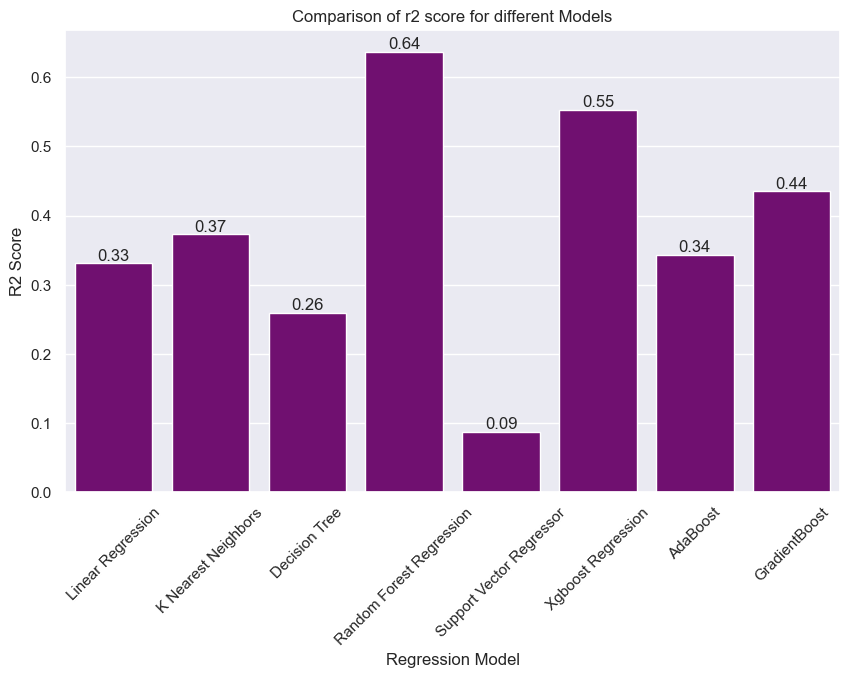

In [66]:
plt.figure(figsize=(10, 6))
ax=sns.barplot(x=model_list,y=accuracy_list,legend=False,color='purple')
plt.xticks(rotation=45)
ax.bar_label(ax.containers[0], fmt="%.2f")
plt.title("Comparison of r2 score for different Models")
plt.xlabel("Regression Model")
plt.ylabel("R2 Score")
plt.show()

# Hyperparameter Tuning

## Random Search CV

In [113]:
model=RandomForestRegressor(random_state=42)


params={ 'n_estimators':[100,200,300],
        'max_depth':[3,7,15],
        'min_samples_split':[5,10,15],
        'min_samples_leaf':[5,8,12]
random=RandomizedSearchCV(model,param_distributions=params,n_jobs=-1)

In [119]:
random.fit(x_train,y_train)

RandomizedSearchCV(estimator=RandomForestRegressor(random_state=42), n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [3, 7, 15],
                                        'min_samples_leaf': [5, 8, 12],
                                        'min_samples_split': [5, 10, 15],
                                        'n_estimators': [100, 200, 300]})

In [120]:
random.best_params_

{'n_estimators': 300,
 'min_samples_split': 5,
 'min_samples_leaf': 5,
 'max_depth': 15,
 'bootstrap': True}

## Grid Search CV

In [179]:
model=RandomForestRegressor(random_state=42)


params={ 'n_estimators':[300],
        'max_depth':[15,18],
        'min_samples_split':[5,7],
        'min_samples_leaf':[5,6] }
grid=GridSearchCV(model,param_grid=params,n_jobs=-1)
grid.fit(x_train,y_train)
print(grid.best_params_)

{'max_depth': 18, 'min_samples_leaf': 5, 'min_samples_split': 5, 'n_estimators': 300}


In [112]:
rf=RandomForestRegressor(n_estimators= 300,
 min_samples_split= 5,
 min_samples_leaf=5,
 max_depth=18)
rf.fit(x_train,y_train)

RandomForestRegressor(max_depth=18, min_samples_leaf=5, min_samples_split=5,
                      n_estimators=300)

In [113]:
y_pred_test=rf.predict(x_test)
y_pred_train=rf.predict(x_train)

In [114]:
train_accuracy = r2_score(y_train,y_pred_train) 

In [115]:
test_accuracy = r2_score(y_test,y_pred_test)

In [116]:
mae=mean_absolute_error(y_test,y_pred_test)
mse=mean_squared_error(y_train,y_pred_train)

In [117]:
print("Training R2 score: ", train_accuracy)
print("Testing R2 score: ", test_accuracy)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

Training R2 score:  0.7898274420825115
Testing R2 score:  0.6190659258626017
Mean Absolute Error (MAE): 3564.676971469631
Mean Squared Error (MSE): 13507828.0202672


## Feature Importance 

In [119]:
importances=rf.feature_importances_
importances

array([0.52921816, 0.15295327, 0.11158275, 0.10417135, 0.07471857,
       0.01978622, 0.00756968])

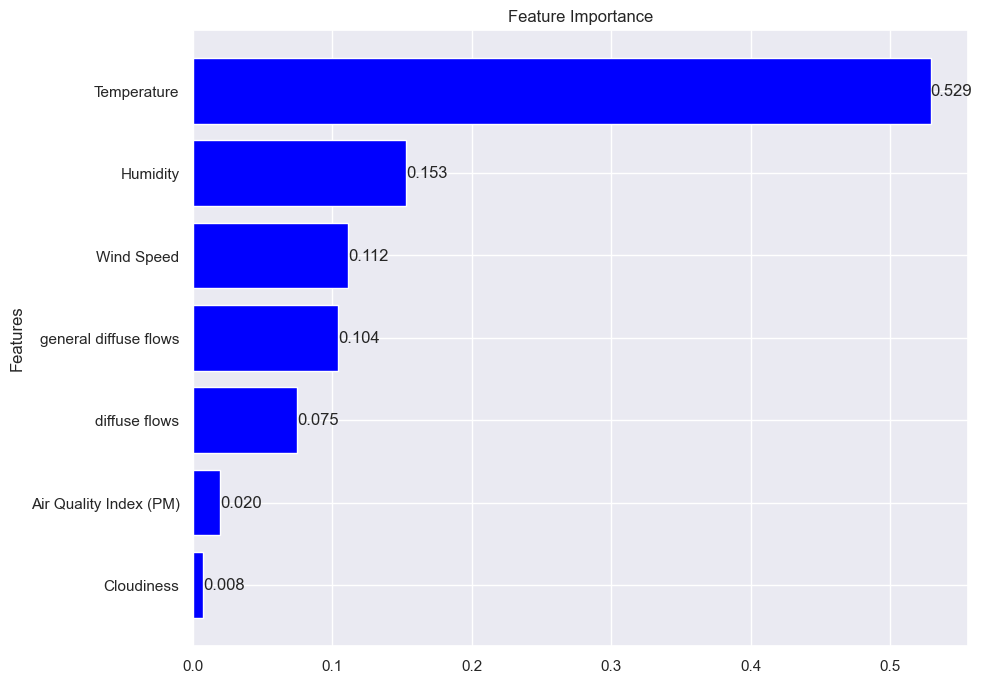

In [120]:
feature_names= pd.DataFrame(x_train).columns

feature_importance = pd.DataFrame({'Feature': feature_names, 'Importance':importances})
feature_importance = feature_importance.sort_values(by='Importance',ascending = False)

fig,ax=plt.subplots(figsize=(10,8))
bars=ax.barh(feature_importance['Feature'],feature_importance['Importance'], color = 'blue')
ax.invert_yaxis()
ax.bar_label(bars, fmt="%.3f")
plt.ylabel('Features')
plt.title('Feature Importance')
plt.show()